In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df_quan = pd.read_excel('./TRAIN/TRAIN_QUANTITATIVE_METADATA.xlsx')
df_target = pd.read_excel('TRAIN/TRAINING_SOLUTIONS.xlsx')
df_connectome = pd.read_csv('TRAIN/TRAIN_FUNCTIONAL_CONNECTOME_MATRICES.csv')
df_connectome.head()

,participant_id,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,0throw_6thcolumn,0throw_7thcolumn,0throw_8thcolumn,0throw_9thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,70z8Q2xdTXM3,0.093473,0.146902,0.067893,0.015141,0.070221,0.063997,0.055382,-0.035335,0.068583,...,0.003404,-0.010359,-0.050968,-0.014365,0.128066,0.112646,-0.058980,0.028228,0.133582,0.143372
1,WHWymJu6zNZi,0.029580,0.179323,0.112933,0.038291,0.104899,0.064250,0.008488,0.077505,-0.004750,...,-0.008409,-0.008479,0.020891,0.017754,0.094040,0.035141,0.032537,0.075007,0.115350,0.138200
2,4PAQp1M6EyAo,-0.051580,0.139734,0.068295,0.046991,0.111085,0.026978,0.151377,0.021198,0.083721,...,0.053245,-0.028003,0.028773,0.024556,0.166343,0.058925,0.035485,0.063661,0.042862,0.162162
3,obEacy4Of68I,0.016273,0.204702,0.115980,0.043103,0.056431,0.057615,0.055773,0.075030,0.001033,...,-0.023918,-0.005356,0.018607,0.016193,0.072955,0.130135,0.056120,0.084784,0.114148,0.190584
4,s7WzzDcmDOhF,0.065771,0.098714,0.097604,0.112988,0.071139,0.085607,0.019392,-0.036403,-0.020375,...,0.066439,-0.076680,-0.047530,-0.031443,0.221213,0.007343,0.005763,0.083820,0.079582,0.067269


In [4]:
num_patients = df_quan.shape[0]
num_patients

1213

In [5]:
df_quan[['participant_id','SDQ_SDQ_Externalizing']]

,participant_id,SDQ_SDQ_Externalizing
0,UmrK0vMLopoR,5
1,CPaeQkhcjg7d,8
2,Nb4EetVPm3gs,8
3,p4vPhVu91o4b,16
4,M09PXs7arQ5E,11
...,...,...
1208,Atx7oub96GXS,7
1209,groSbUfkQngM,11
1210,zmxGvIrOD0bt,3
1211,rOmWFuJCud5G,9


In [6]:
df_quan_Hyper = df_quan[['participant_id','SDQ_SDQ_Hyperactivity']]

df_quan_Ext = df_quan[['participant_id','SDQ_SDQ_Externalizing']]


In [7]:
df_quan['SDQ_SDQ_Externalizing'].isnull().sum()

0

In [8]:
df_connectome.head()

,participant_id,0throw_1thcolumn,0throw_2thcolumn,0throw_3thcolumn,0throw_4thcolumn,0throw_5thcolumn,0throw_6thcolumn,0throw_7thcolumn,0throw_8thcolumn,0throw_9thcolumn,...,195throw_196thcolumn,195throw_197thcolumn,195throw_198thcolumn,195throw_199thcolumn,196throw_197thcolumn,196throw_198thcolumn,196throw_199thcolumn,197throw_198thcolumn,197throw_199thcolumn,198throw_199thcolumn
0,70z8Q2xdTXM3,0.093473,0.146902,0.067893,0.015141,0.070221,0.063997,0.055382,-0.035335,0.068583,...,0.003404,-0.010359,-0.050968,-0.014365,0.128066,0.112646,-0.058980,0.028228,0.133582,0.143372
1,WHWymJu6zNZi,0.029580,0.179323,0.112933,0.038291,0.104899,0.064250,0.008488,0.077505,-0.004750,...,-0.008409,-0.008479,0.020891,0.017754,0.094040,0.035141,0.032537,0.075007,0.115350,0.138200
2,4PAQp1M6EyAo,-0.051580,0.139734,0.068295,0.046991,0.111085,0.026978,0.151377,0.021198,0.083721,...,0.053245,-0.028003,0.028773,0.024556,0.166343,0.058925,0.035485,0.063661,0.042862,0.162162
3,obEacy4Of68I,0.016273,0.204702,0.115980,0.043103,0.056431,0.057615,0.055773,0.075030,0.001033,...,-0.023918,-0.005356,0.018607,0.016193,0.072955,0.130135,0.056120,0.084784,0.114148,0.190584
4,s7WzzDcmDOhF,0.065771,0.098714,0.097604,0.112988,0.071139,0.085607,0.019392,-0.036403,-0.020375,...,0.066439,-0.076680,-0.047530,-0.031443,0.221213,0.007343,0.005763,0.083820,0.079582,0.067269


In [9]:
df_connectome.shape

(1213, 19901)

In [10]:
df_hasADHD_F = df_target[(df_target["ADHD_Outcome"] == 1) & (df_target["Sex_F"] == 1)]
df_hasADHD_M = df_target[(df_target["ADHD_Outcome"] == 1) & (df_target["Sex_F"] == 0)]
df_noADHD_F = df_target[(df_target["ADHD_Outcome"] == 0) & (df_target["Sex_F"] == 1)]
df_noADHD_M = df_target[(df_target["ADHD_Outcome"] == 0) & (df_target["Sex_F"] == 0)]

In [11]:
df_connectome_hasADHD_F = df_connectome[df_connectome['participant_id'].isin(df_hasADHD_F['participant_id'])]
df_connectome_hasADHD_M = df_connectome[df_connectome['participant_id'].isin(df_hasADHD_M['participant_id'])]
df_connectome_noADHD_F = df_connectome[df_connectome['participant_id'].isin(df_noADHD_F['participant_id'])]
df_connectome_noADHD_M = df_connectome[df_connectome['participant_id'].isin(df_noADHD_M['participant_id'])]

In [12]:
df_connectome_hasADHD_F.shape

(250, 19901)

In [13]:
df_quan_Hyper.shape

(1213, 2)

In [14]:
df_filtered_Hyper_F = df_quan_Hyper[df_quan_Hyper['participant_id'].isin(df_hasADHD_F['participant_id'])]
df_filtered_Hyper_M = df_quan_Hyper[df_quan_Hyper['participant_id'].isin(df_hasADHD_M['participant_id'])]
df_filtered_Hyper_M.shape

(581, 2)

In [15]:
df_filtered_Ext_F = df_quan_Ext[df_quan_Ext['participant_id'].isin(df_hasADHD_F['participant_id'])]
df_filtered_Ext_M = df_quan_Ext[df_quan_Ext['participant_id'].isin(df_hasADHD_M['participant_id'])]

In [16]:
print("Min:", np.min(df_connectome_hasADHD_F.drop("participant_id", axis=1).values))
print("Max:", np.max(df_connectome_hasADHD_F.drop("participant_id", axis=1).values))

Min: -0.3743669498233847
Max: 0.5208741506042309


In [17]:
num_regions = 200  # Expected brain regions

# Compute expected and actual number of upper triangle elements
expected_upper_triangle = (num_regions * (num_regions - 1)) // 2
actual_vector_length = len(df_connectome_hasADHD_F.drop("participant_id", axis=1).iloc[0])

print(f"Expected Upper Triangle Elements: {expected_upper_triangle}")
print(f"Actual Connectivity Vector Length: {actual_vector_length}")

Expected Upper Triangle Elements: 19900
Actual Connectivity Vector Length: 19900


In [18]:
# with ADHD
num_regions = 200  

# Drop the participant_id column to keep only connectivity values
connectivity_vectors = df_connectome_hasADHD_F.iloc[:, 1:].values  # Shape: (250, 19900)

# Ensure the shape is correct
num_patients = connectivity_vectors.shape[0]
assert connectivity_vectors.shape[1] == (num_regions * (num_regions - 1)) // 2, "Unexpected number of connectivity values!"

# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_hasADHD_F = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_hasADHD_F[i] = matrix  

all_FC_hasADHD_F.shape

(250, 200, 200)

Text(0.5, 1.0, 'first female patient with ADHD')

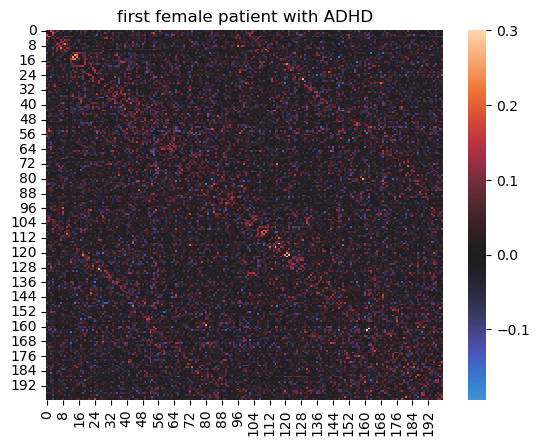

In [19]:
sns.heatmap(all_FC_hasADHD_F[0], center=0)
plt.title('first female patient with ADHD')

Text(0.5, 1.0, 'first female patient without ADHD')

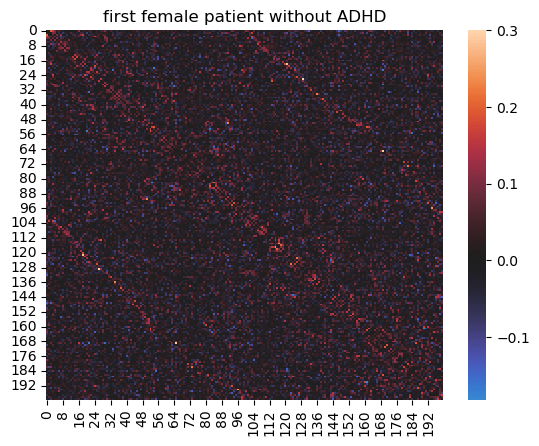

In [20]:
#without ADHD Female
num_regions = 200  

# Drop the participant_id column to keep only connectivity values
connectivity_vectors = df_connectome_noADHD_F.iloc[:, 1:].values  # Shape: (250, 19900)

# Ensure the shape is correct
num_patients = connectivity_vectors.shape[0]
assert connectivity_vectors.shape[1] == (num_regions * (num_regions - 1)) // 2, "Unexpected number of connectivity values!"

# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_noADHD_F = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_noADHD_F[i] = matrix  

sns.heatmap(all_FC_noADHD_F[0], center=0)
plt.title('first female patient without ADHD')

(array([2.000e+00, 1.000e+00, 3.000e+00, 9.000e+00, 2.000e+01, 3.200e+01,
        7.500e+01, 1.410e+02, 2.320e+02, 4.390e+02, 7.350e+02, 1.196e+03,
        1.797e+03, 2.443e+03, 2.704e+03, 2.753e+03, 2.296e+03, 1.722e+03,
        1.187e+03, 7.620e+02, 5.070e+02, 3.120e+02, 2.170e+02, 1.270e+02,
        6.600e+01, 4.000e+01, 3.500e+01, 1.800e+01, 1.600e+01, 0.000e+00,
        5.000e+00, 2.000e+00, 2.000e+00, 1.000e+00, 1.000e+00, 1.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([-0.19818439, -0.18481684, -0.17144928, -0.15808173, -0.14471418,
        -0.13134662, -0.11797907, -0.10461151, -0.09124396, -0.0778764 ,
        -0.06450885, -0.0511413 , -0.03777374, -0.02440619, -0.01103863,
         0.00232892,  0.01569647,  0.02906403,  0.04243158,  0.05579914,
         0.06916669,  0.08253425,  0.0959018 ,  0.10926935,  0.12263691,
         0.13600446,  0.14937202,  0.16273957,  0.17610712,  0.18947468,
         0.20284223,  0.21620979,  0.22957734,  0.24294489,  0.2

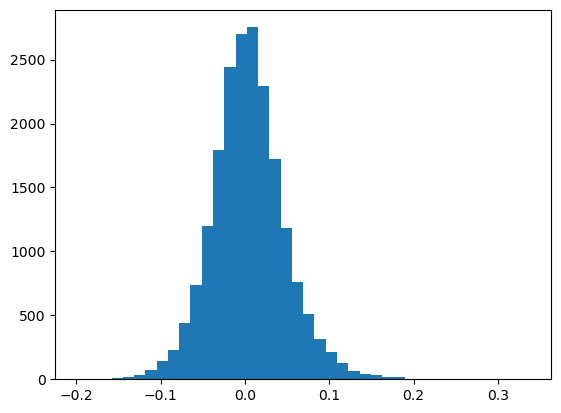

In [21]:
plt.hist(df_connectome_hasADHD_F.iloc[90, 1:].values, bins=40)
#no need for fisher Z transfrmation already normal distribution

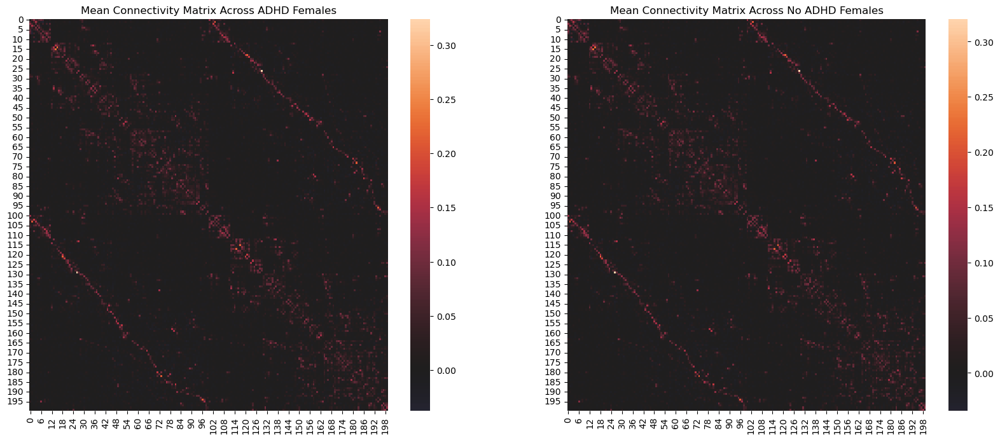

In [22]:
mean_FC_hasADHD_F = np.mean(all_FC_hasADHD_F, axis=0)
mean_FC_noADHD_F = np.mean(all_FC_noADHD_F, axis=0)

# Plot the mean connectivity matrix
plt.figure(figsize=(20, 8))
plt.subplot(121)
sns.heatmap(mean_FC_hasADHD_F,center=0)
plt.title("Mean Connectivity Matrix Across ADHD Females")
plt.subplot(122)
sns.heatmap(mean_FC_noADHD_F,center=0)
plt.title("Mean Connectivity Matrix Across No ADHD Females")
plt.show()

In [23]:
# with ADHD Male
num_regions = 200  

# Drop the participant_id column to keep only connectivity values
connectivity_vectors_M = df_connectome_hasADHD_M.iloc[:, 1:].values  # Shape: (581, 19900)

# Ensure the shape is correct
num_patients = connectivity_vectors_M.shape[0]
assert connectivity_vectors_M.shape[1] == (num_regions * (num_regions - 1)) // 2, "Unexpected number of connectivity values!"

# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_hasADHD_M = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors_M[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)
    all_FC_hasADHD_M[i] = matrix  

# Display shape confirmation
all_FC_hasADHD_M.shape

(581, 200, 200)

Text(0.5, 1.0, 'first Male patient with ADHD')

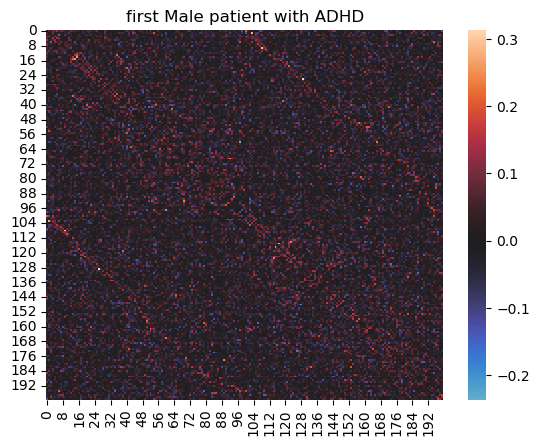

In [24]:
sns.heatmap(all_FC_hasADHD_M[1], center=0)
plt.title('first Male patient with ADHD')

Text(0.5, 1.0, 'first Male patient without ADHD')

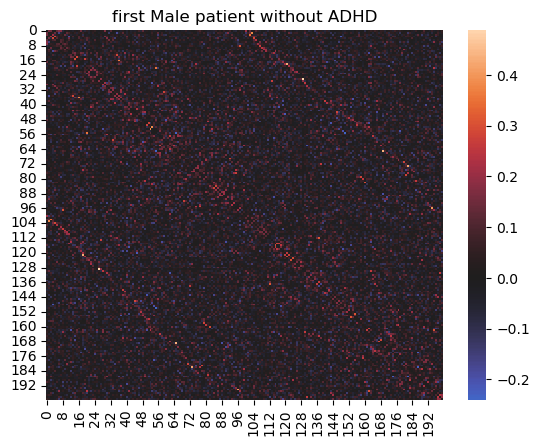

In [25]:
#without ADHD Male
num_regions = 200  

# Drop the participant_id column to keep only connectivity values
connectivity_vectors = df_connectome_noADHD_M.iloc[:, 1:].values 

# Ensure the shape is correct
num_patients = connectivity_vectors.shape[0]
assert connectivity_vectors.shape[1] == (num_regions * (num_regions - 1)) // 2, "Unexpected number of connectivity values!"

# Get upper triangular indices
upper_tri_indices = np.triu_indices(num_regions, k=1)

# Initialize an array to store all patients' connectivity matrices
all_FC_noADHD_M = np.zeros((num_patients, num_regions, num_regions))

# Reconstruct connectivity matrices for all patients
for i in range(num_patients):
    matrix = np.zeros((num_regions, num_regions))
    matrix[upper_tri_indices] = connectivity_vectors[i]  # Fill upper triangle
    matrix += matrix.T  # Mirror upper triangle to lower triangle
    np.fill_diagonal(matrix, 0)  
    all_FC_noADHD_M[i] = matrix  

sns.heatmap(all_FC_noADHD_M[1], center=0)
plt.title('first Male patient without ADHD')

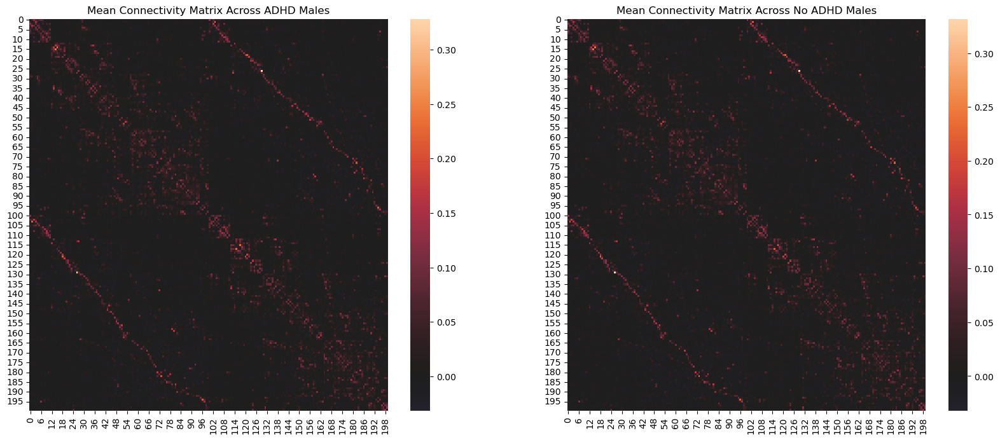

In [26]:
mean_FC_hasADHD_M= np.mean(all_FC_hasADHD_M, axis=0)
mean_FC_noADHD_M = np.mean(all_FC_noADHD_M, axis=0)

# Plot the mean connectivity matrix
plt.figure(figsize=(20, 8))
plt.subplot(121)
sns.heatmap(mean_FC_hasADHD_M,center=0)
plt.title("Mean Connectivity Matrix Across ADHD Males")
plt.subplot(122)
sns.heatmap(mean_FC_noADHD_M,center=0)
plt.title("Mean Connectivity Matrix Across No ADHD Males")
plt.show()

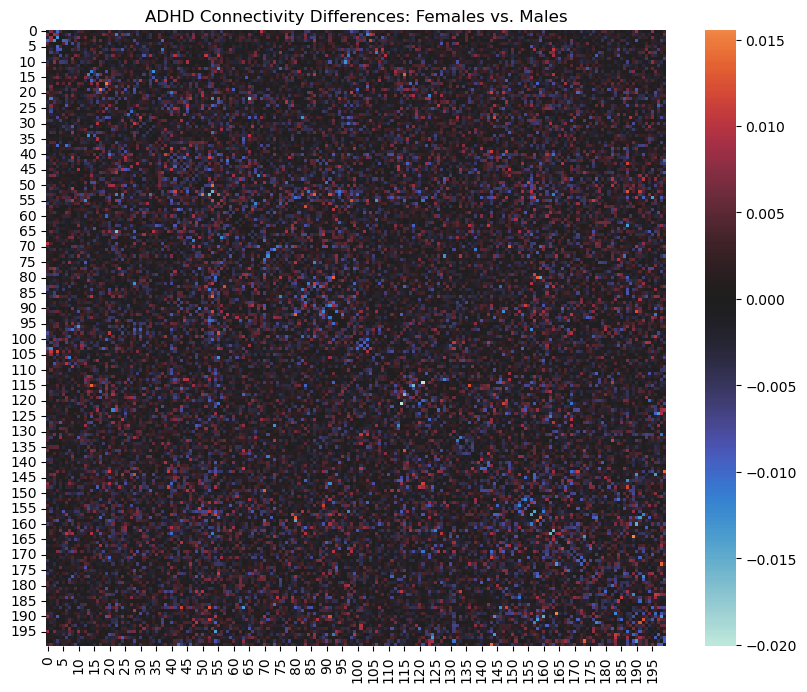

In [27]:
# Compute male-female difference
connectivity_diff_sex = mean_FC_hasADHD_F - mean_FC_hasADHD_M
plt.figure(figsize=(10, 8))
sns.heatmap(connectivity_diff_sex, center=0)
plt.title("ADHD Connectivity Differences: Females vs. Males")
plt.show()

In [28]:
all_FC_hasADHD_F.shape

(250, 200, 200)

In [29]:
all_FC_noADHD_F.shape

(166, 200, 200)

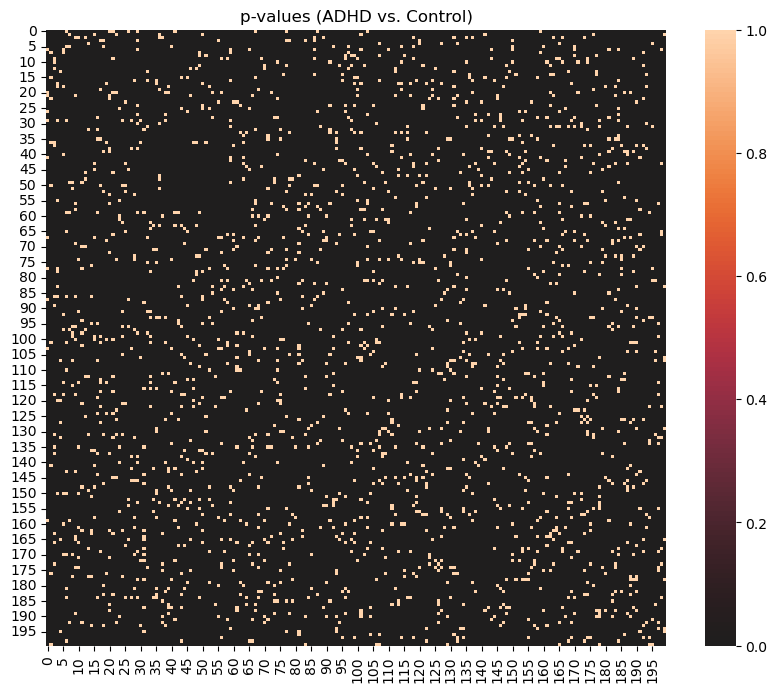

In [30]:
from scipy.stats import ttest_ind
# Perform t-tests for each connection across ADHD and Control groups
t_values, p_values = ttest_ind(all_FC_hasADHD_F, all_FC_noADHD_F, axis=0)
# t_values = np.nan_to_num(t_values, nan=0)
# p_values = np.nan_to_num(p_values, nan=1)  # Set p-values to 1 (no significance)
# plot significant connections (many false positives?????????????)
plt.figure(figsize=(10, 8))
sns.heatmap(p_values < 0.05, center=0)
plt.title("p-values (ADHD vs. Control)")
plt.show()


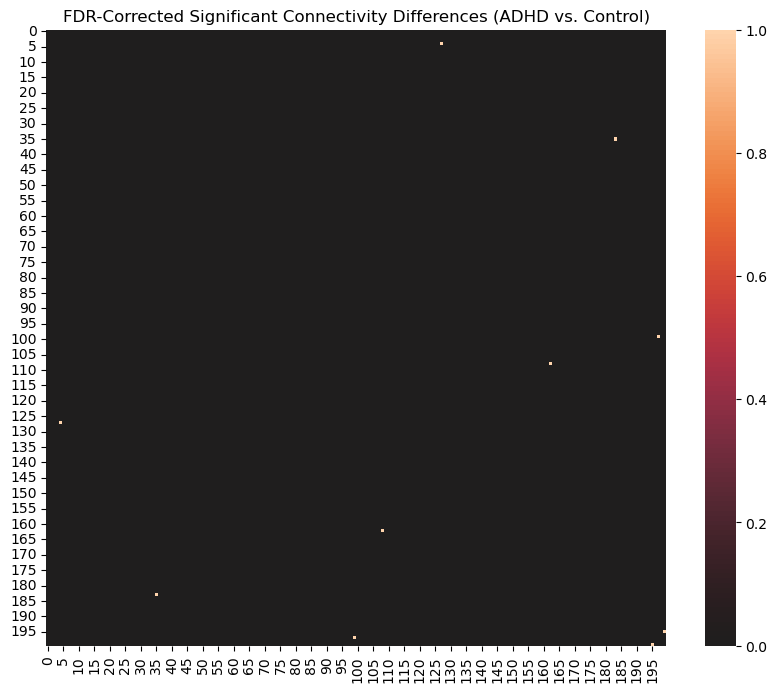

In [31]:
# NO FALSE POSITIVES 
# alpha mean chance to observe ones so 0.7 is a lot!


from statsmodels.stats.multitest import fdrcorrection

# Apply FDR correction
significant_mask, p_corrected = fdrcorrection(p_values.flatten(), alpha=0.7)
significant_mask = significant_mask.reshape((200, 200))  # Reshape back to 200x200

# Plot corrected significant results
plt.figure(figsize=(10, 8))
sns.heatmap(significant_mask, center=0)
plt.title("FDR-Corrected Significant Connectivity Differences (ADHD vs. Control)")
# plt.colorbar()
plt.show()

In [32]:
import networkx as nx

# Convert connectivity matrix into an undirected graph (thresholding needed)
threshold = 0.094  # Set a threshold to remove weak connections
binary_matrix = (mean_FC_hasADHD_F > threshold).astype(int)
# Create a graph from the binary matrix
graph = nx.from_numpy_array(binary_matrix)

# Compute degree centrality
degree_centrality = nx.degree_centrality(graph)

# Convert to a DataFrame
degree_df = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['Degree Centrality'])

clustering_coeffs = nx.clustering(graph)
clustering_df = pd.DataFrame.from_dict(clustering_coeffs, orient='index', columns=['Clustering Coefficient'])


In [33]:
from networkx.algorithms.community import greedy_modularity_communities
# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})

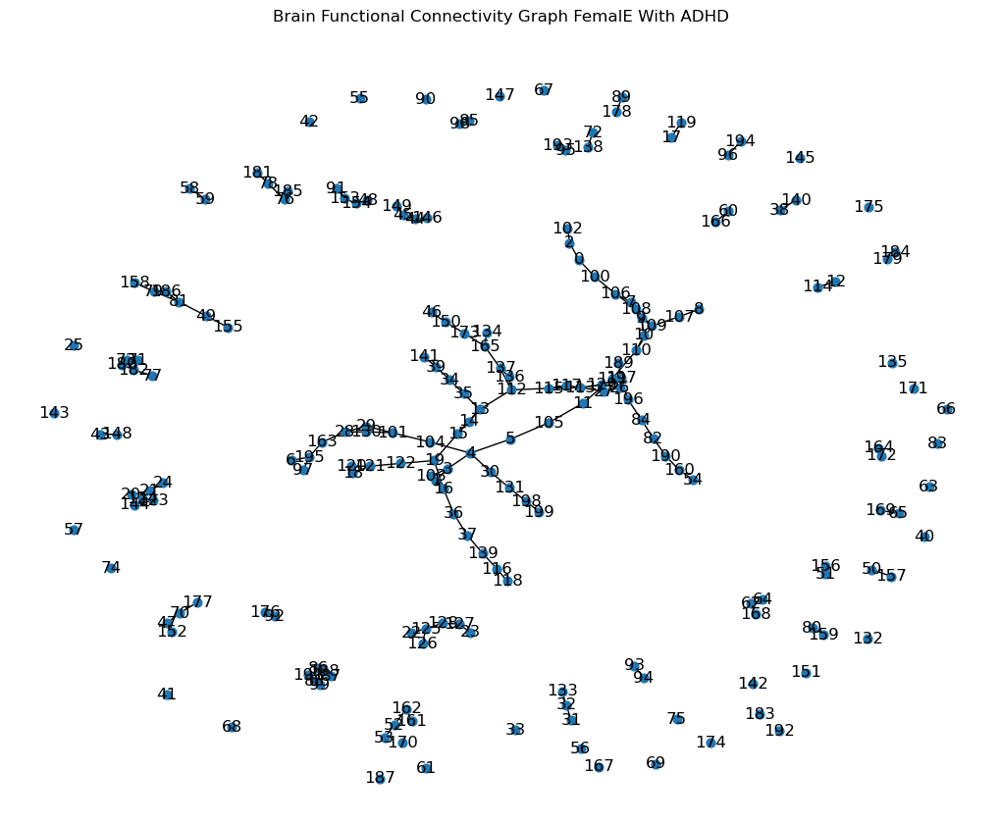

In [34]:
from networkx.algorithms.community import greedy_modularity_communities

# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})

plt.figure(figsize=(10, 8))
nx.draw(graph, node_size=40, with_labels=True)
plt.title("Brain Functional Connectivity Graph FemalE With ADHD")
plt.show()

In [35]:
hubs = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)[:10]
print("Top 10 Most Connected Brain Regions:", hubs)


Top 10 Most Connected Brain Regions: [(4, 0.020100502512562814), (9, 0.020100502512562814), (13, 0.020100502512562814), (21, 0.020100502512562814), (109, 0.020100502512562814), (112, 0.020100502512562814), (113, 0.020100502512562814), (3, 0.01507537688442211), (15, 0.01507537688442211), (19, 0.01507537688442211)]


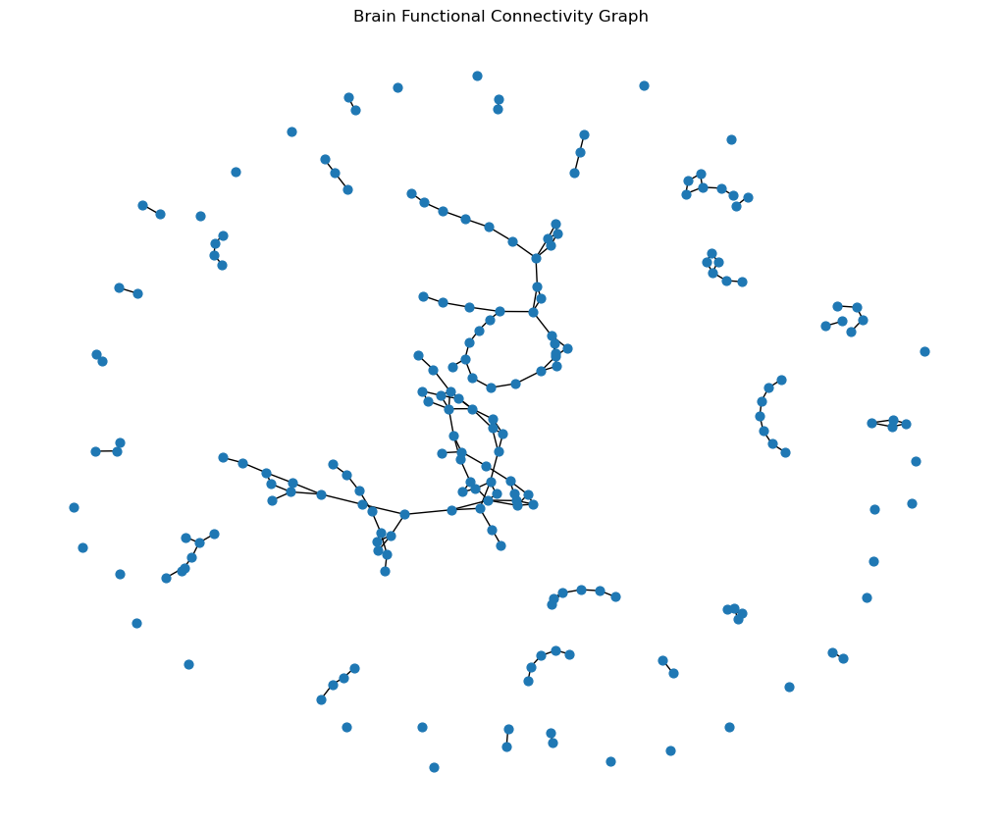

In [36]:

# Convert connectivity matrix into an undirected graph (thresholding needed)
threshold = 0.09  # Set a threshold to remove weak connections
binary_matrix = (mean_FC_noADHD_F > threshold).astype(int)
# Create a graph from the binary matrix
graph = nx.from_numpy_array(binary_matrix)

# Compute degree centrality
degree_centrality = nx.degree_centrality(graph)

# Convert to a DataFrame
degree_df = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['Degree Centrality'])

clustering_coeffs = nx.clustering(graph)
clustering_df = pd.DataFrame.from_dict(clustering_coeffs, orient='index', columns=['Clustering Coefficient'])

# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})
# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})

plt.figure(figsize=(10, 8))
nx.draw(graph, node_size=40, with_labels=False)
plt.title("Brain Functional Connectivity Graph")
plt.show()

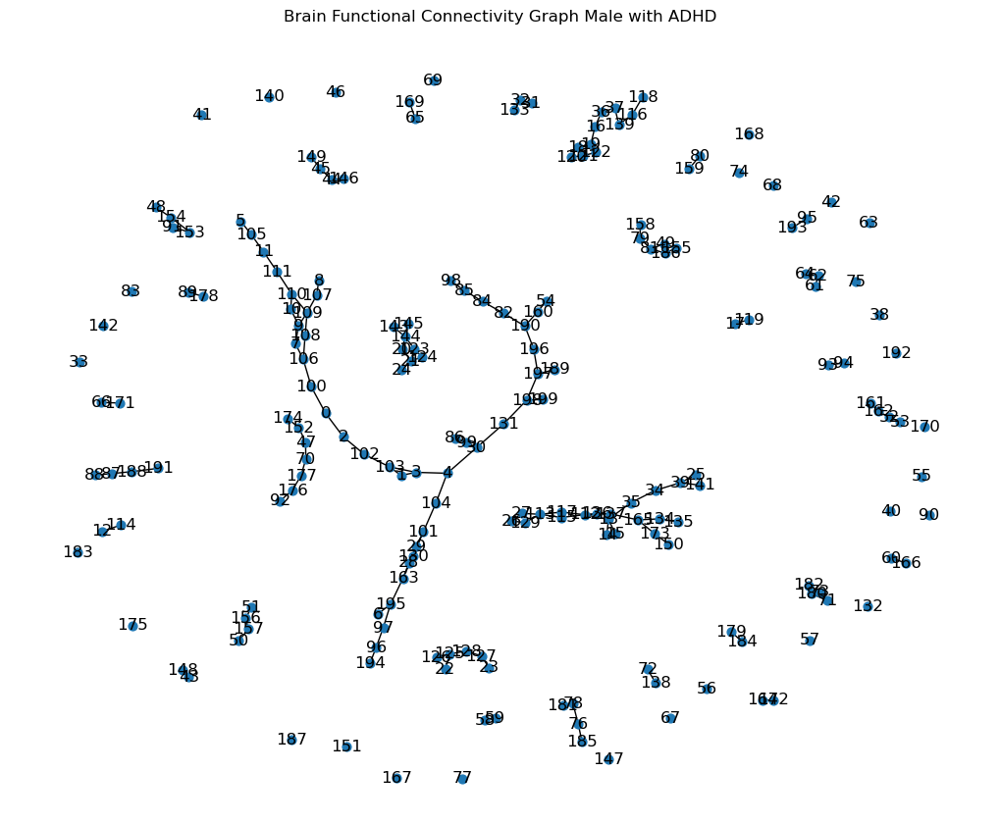

In [37]:

# Convert connectivity matrix into an undirected graph (thresholding needed)
threshold = 0.094  # Set a threshold to remove weak connections
binary_matrix = (mean_FC_hasADHD_M > threshold).astype(int)
# Create a graph from the binary matrix
graph = nx.from_numpy_array(binary_matrix)

# Compute degree centrality
degree_centrality = nx.degree_centrality(graph)

# Convert to a DataFrame
degree_df = pd.DataFrame.from_dict(degree_centrality, orient='index', columns=['Degree Centrality'])

clustering_coeffs = nx.clustering(graph)
clustering_df = pd.DataFrame.from_dict(clustering_coeffs, orient='index', columns=['Clustering Coefficient'])

# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})
# Find modularity communities
communities = list(greedy_modularity_communities(graph))

# Convert to DataFrame for viewing
community_df = pd.DataFrame({"Node": range(len(communities)), "Community": [len(c) for c in communities]})

plt.figure(figsize=(10, 8))
nx.draw(graph, node_size=40, with_labels=True, )
plt.title("Brain Functional Connectivity Graph Male with ADHD")
plt.show()

c:\Users\Kiana Kazeminejad\.conda\envs\monkey\Lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


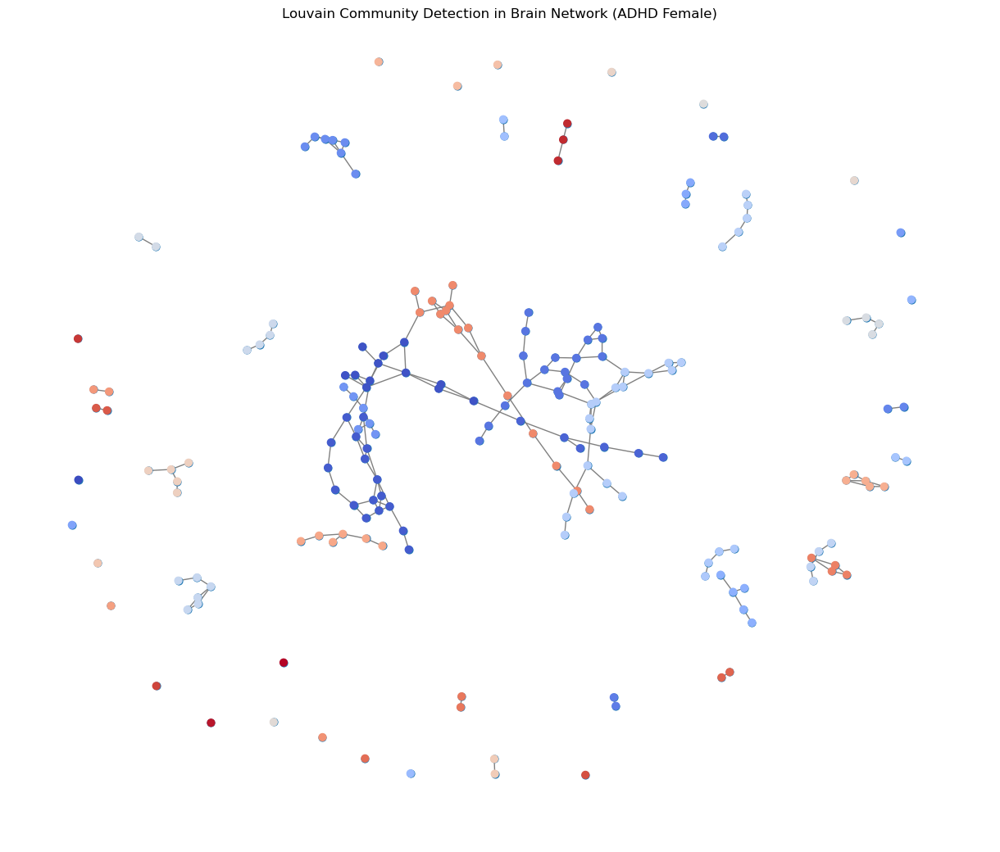

In [38]:
import networkx as nx
import community  # Louvain community detection

# Set a threshold to remove weak connections
threshold = 0.09
binary_matrix_ADHD_F = (mean_FC_hasADHD_F > threshold).astype(int)

# Create graph from binary adjacency matrix
graph_ADHD_F = nx.from_numpy_array(binary_matrix_ADHD_F)

# Apply the Louvain algorithm for community detection
partition = community.best_partition(graph_ADHD_F)

# Convert partition dictionary to DataFrame
louvain_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])


# Plot the Brain Network with Louvain Community Coloring
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(graph_ADHD_F, seed=42)
nx.draw(graph_ADHD_F, pos, node_size=40, with_labels=False, edge_color="gray", cmap=plt.get_cmap("coolwarm"))

# Color nodes based on their assigned Louvain community
colors = [partition[node] for node in graph_ADHD_F.nodes()]
nx.draw_networkx_nodes(graph_ADHD_F, pos, node_color=colors, cmap=plt.get_cmap("coolwarm"), node_size=40)

plt.title("Louvain Community Detection in Brain Network (ADHD Female)")
plt.show()


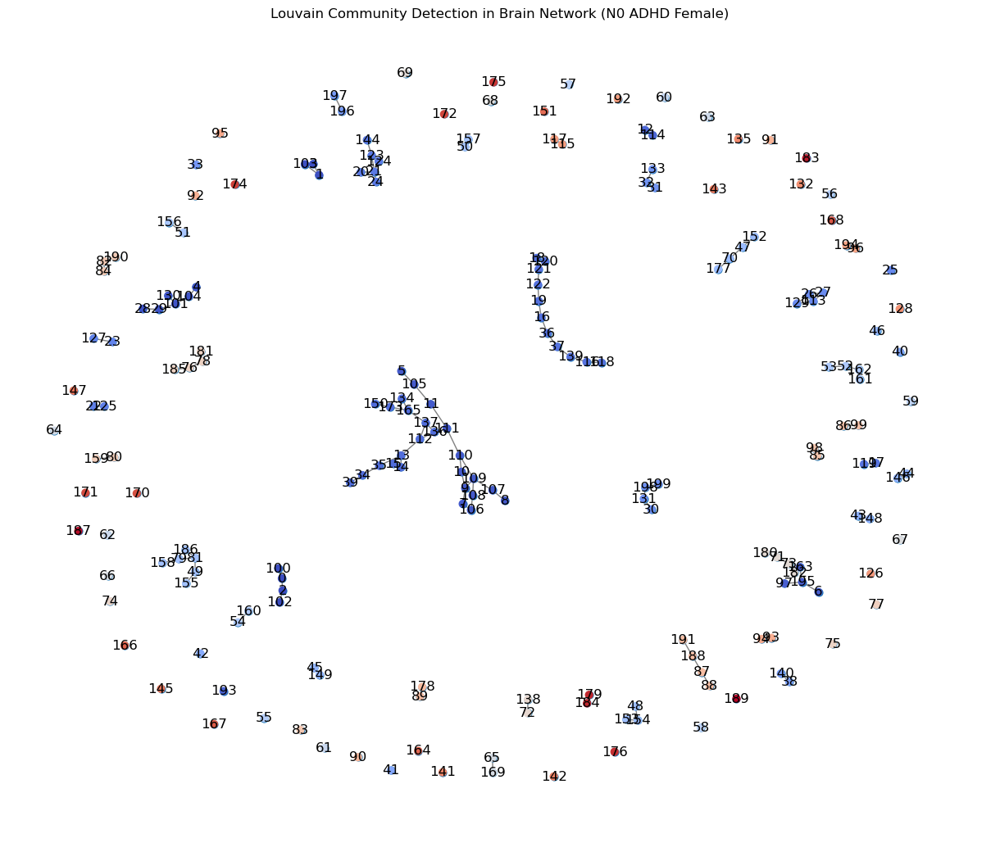

In [39]:
# Set a threshold to remove weak connections
threshold = 0.1
binary_matrix_ADHD_F = (mean_FC_hasADHD_F > threshold).astype(int)

# Create graph from binary adjacency matrix
graph_ADHD_F = nx.from_numpy_array(binary_matrix_ADHD_F)

# Apply the Louvain algorithm for community detection
partition = community.best_partition(graph_ADHD_F)

# Convert partition dictionary to DataFrame
louvain_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])


# Plot the Brain Network with Louvain Community Coloring
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(graph_ADHD_F, seed=42)
nx.draw(graph_ADHD_F, pos, node_size=40, with_labels=True, edge_color="gray", cmap=plt.get_cmap("coolwarm"))

# Color nodes based on their assigned Louvain community
colors = [partition[node] for node in graph_ADHD_F.nodes()]
nx.draw_networkx_nodes(graph_ADHD_F, pos, node_color=colors, cmap=plt.get_cmap("coolwarm"), node_size=40)

plt.title("Louvain Community Detection in Brain Network (N0 ADHD Female)")
plt.show()

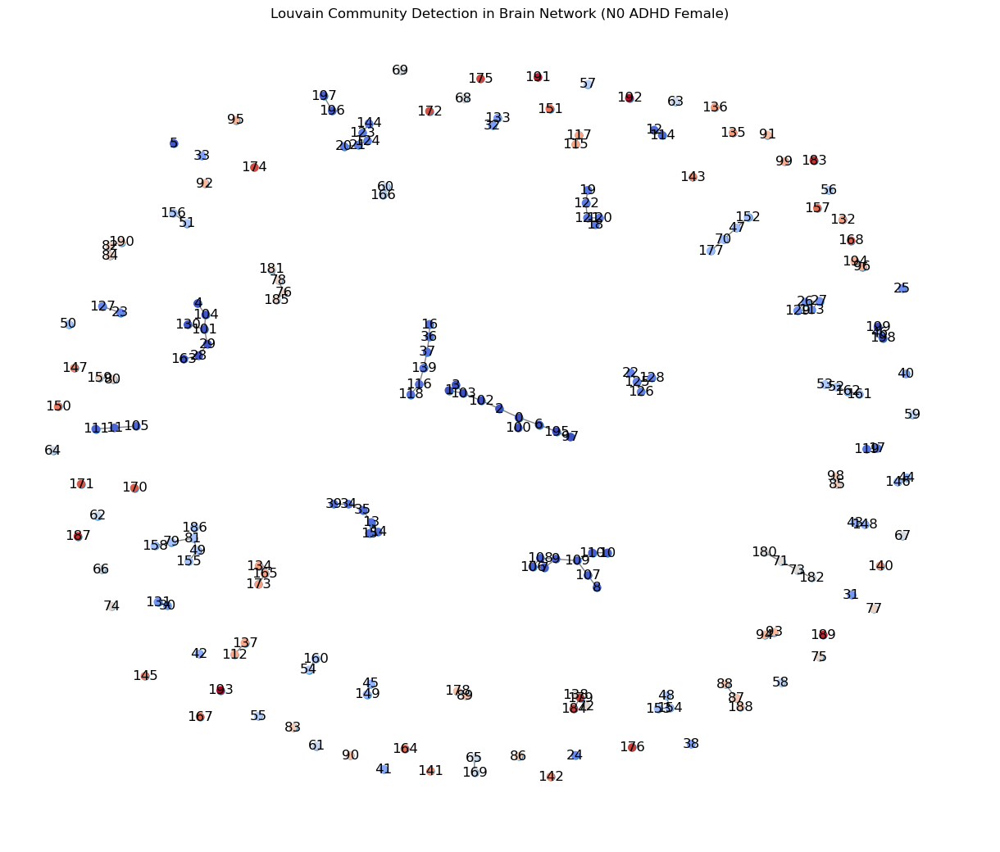

In [40]:
# Set a threshold to remove weak connections
threshold = 0.1
binary_matrix_ADHD_F = (mean_FC_noADHD_F > threshold).astype(int)

# Create graph from binary adjacency matrix
graph_noADHD_F = nx.from_numpy_array(binary_matrix_ADHD_F)

# Apply the Louvain algorithm for community detection
partition = community.best_partition(graph_noADHD_F)

# Convert partition dictionary to DataFrame
louvain_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])


# Plot the Brain Network with Louvain Community Coloring
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(graph_noADHD_F, seed=42)
nx.draw(graph_noADHD_F, pos, node_size=40, with_labels=True, edge_color="gray", cmap=plt.get_cmap("coolwarm"))

# Color nodes based on their assigned Louvain community
colors = [partition[node] for node in graph_noADHD_F.nodes()]
nx.draw_networkx_nodes(graph_noADHD_F, pos, node_color=colors, cmap=plt.get_cmap("coolwarm"), node_size=40)

plt.title("Louvain Community Detection in Brain Network (N0 ADHD Female)")
plt.show()

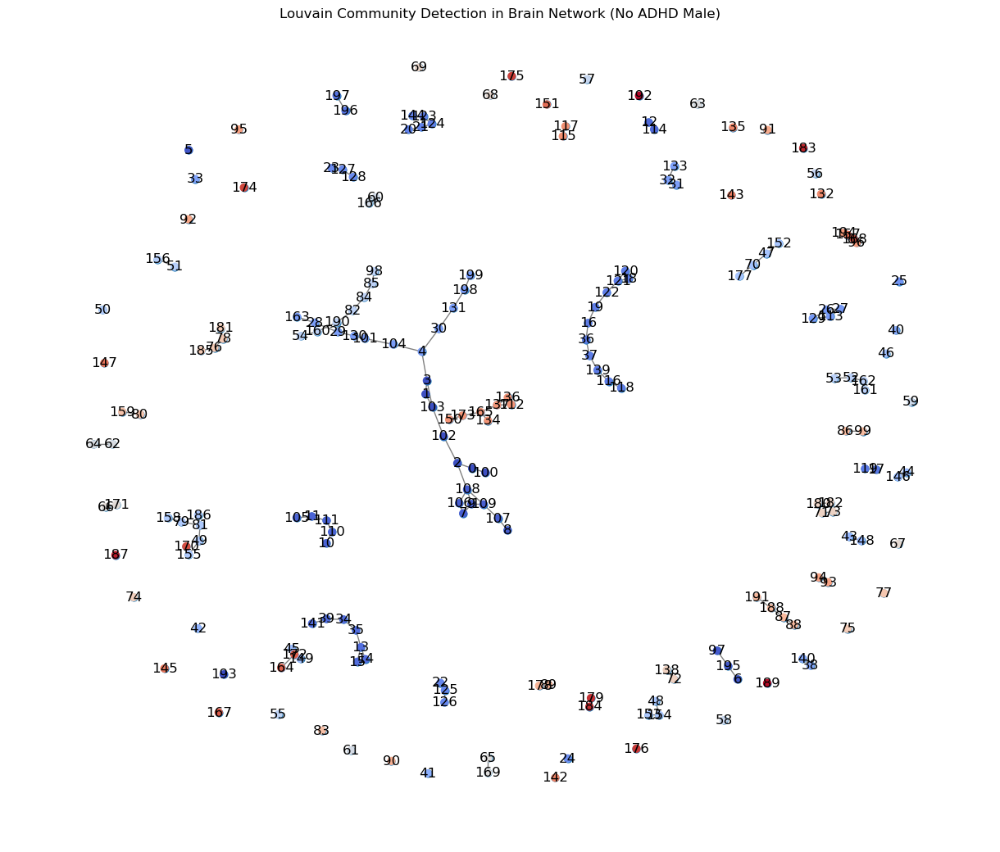

In [41]:
# Set a threshold to remove weak connections
threshold = 0.1
binary_matrix_ADHD_M = (mean_FC_noADHD_M > threshold).astype(int)

# Create graph from binary adjacency matrix
graph_noADHD_M = nx.from_numpy_array(binary_matrix_ADHD_M)

# Apply the Louvain algorithm for community detection
partition = community.best_partition(graph_noADHD_M)

# Convert partition dictionary to DataFrame
louvain_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])


# Plot the Brain Network with Louvain Community Coloring
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(graph_noADHD_M, seed=42)
nx.draw(graph_noADHD_M, pos, node_size=40, with_labels=True, edge_color="gray", cmap=plt.get_cmap("coolwarm"))

# Color nodes based on their assigned Louvain community
colors = [partition[node] for node in graph_noADHD_M.nodes()]
nx.draw_networkx_nodes(graph_noADHD_M, pos, node_color=colors, cmap=plt.get_cmap("coolwarm"), node_size=40)

plt.title("Louvain Community Detection in Brain Network (No ADHD Male)")
plt.show()

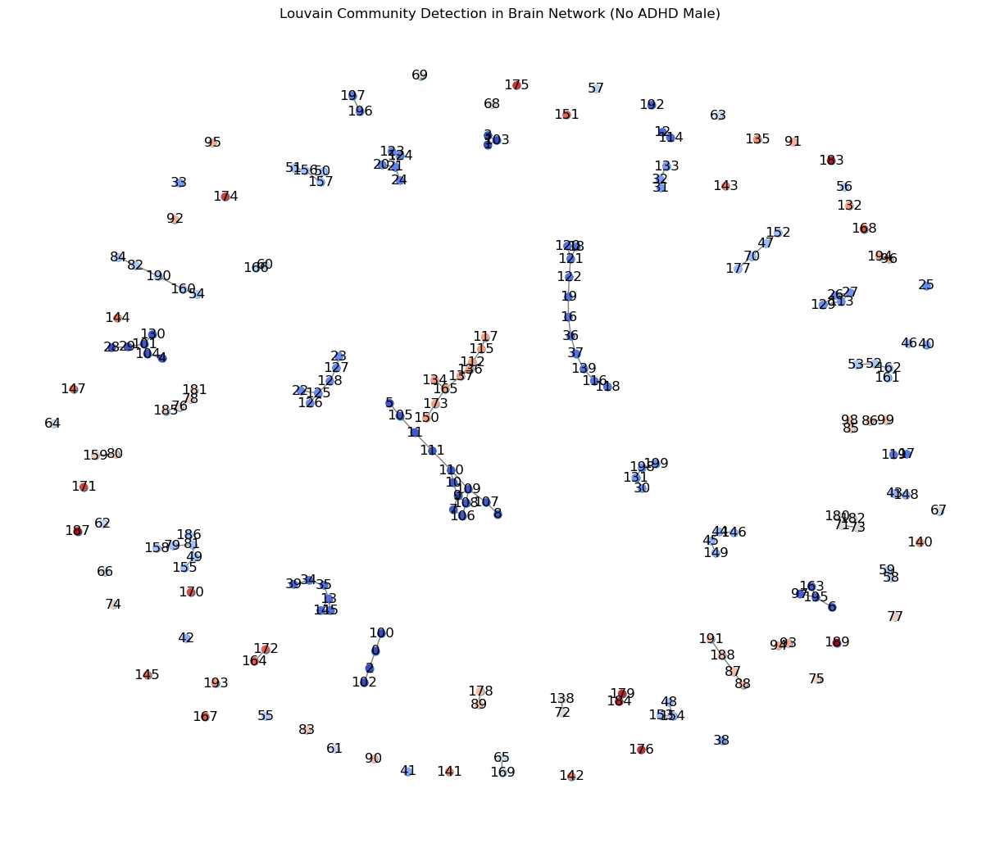

In [42]:
# Set a threshold to remove weak connections
threshold = 0.1
binary_matrix_ADHD_M = (mean_FC_hasADHD_M > threshold).astype(int)

# Create graph from binary adjacency matrix
graph_ADHD_M = nx.from_numpy_array(binary_matrix_ADHD_M)

# Apply the Louvain algorithm for community detection
partition = community.best_partition(graph_ADHD_M)

# Convert partition dictionary to DataFrame
louvain_df = pd.DataFrame(list(partition.items()), columns=['Node', 'Community'])


# Plot the Brain Network with Louvain Community Coloring
plt.figure(figsize=(12, 10))
pos = nx.spring_layout(graph_ADHD_M, seed=42)
nx.draw(graph_ADHD_M, pos, node_size=40, with_labels=True, edge_color="gray", cmap=plt.get_cmap("coolwarm"))

# Color nodes based on their assigned Louvain community
colors = [partition[node] for node in graph_ADHD_M.nodes()]
nx.draw_networkx_nodes(graph_ADHD_M, pos, node_color=colors, cmap=plt.get_cmap("coolwarm"), node_size=40)

plt.title("Louvain Community Detection in Brain Network (No ADHD Male)")
plt.show()